<a href="https://colab.research.google.com/github/aryacodez/Water-Quality/blob/main/Water_Quality.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


**Data Collection**

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
sns.set_theme()
%config InlineBackend.figure_format = 'retina'

from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,roc_auc_score,confusion_matrix,roc_curve
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/water_potability.csv')

In [ ]:
df.sample(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3052,6.155739,166.292920,30284.494869,8.995896,NaN,351.626734,17.404754,75.336207,3.685976,0
2474,4.964070,168.283365,17694.574833,9.725321,333.639511,353.069939,17.293732,67.252514,4.761701,0
2953,7.057553,177.674305,13129.149842,7.312352,367.328533,393.740497,16.356320,53.841797,4.486403,0
3034,6.988206,144.209535,33357.515863,6.771945,NaN,409.006788,17.880332,54.111785,1.899683,0
2811,NaN,114.733545,13677.994040,9.981200,441.826777,524.000355,11.384858,71.153285,3.293848,1
2678,7.586236,190.890219,16409.936560,5.739025,NaN,402.799497,13.906082,95.382662,4.351335,0
537,8.742230,179.409804,9694.354896,6.577128,368.504321,323.744012,13.925010,85.779324,2.842393,0
2019,5.985012,151.360967,20155.434469,7.723292,275.079738,478.332360,18.016266,99.061233,3.764100,1
136,6.063355,160.767311,14775.145596,7.484104,305.828553,327.270239,12.309016,69.038454,3.467337,0
685,3.994498,179.454192,18682.277139,6.464793,331.145621,538.174959,13.916820,NaN,3.379147,1


**DESCRIPTION**

1. **pH value:**
PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.

2. **Hardness:**
Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.

3. **Solids (Total dissolved solids - TDS):**
Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.

4. **Chloramines:**
Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.

5. **Sulfate:**
Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.

6. **Conductivity:**
Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.

7. **Organic_carbon:**
Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.

8. **Trihalomethanes:**
THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.

9. **Turbidity:**
The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.

10. **Potability:**
Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
df.shape

(3276, 10)

In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

**DATA CLEANING & EXPLORATION**

In [ ]:
df.isnull().sum() #finding total number of missing values in each columns

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [ ]:
x = len(df)
(df.isnull().sum() / x) *100   #Percentage of missing values in each column

ph                 14.987790
Hardness            0.000000
Solids              0.000000
Chloramines         0.000000
Sulfate            23.840049
Conductivity        0.000000
Organic_carbon      0.000000
Trihalomethanes     4.945055
Turbidity           0.000000
Potability          0.000000
dtype: float64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [ ]:
# df.dropna(inplace=True)
df['ph']=df['ph'].fillna(df['ph'].mean(skipna=True))
df['Sulfate']=df['Sulfate'].fillna(df['Sulfate'].mean(skipna=True))
df['Trihalomethanes']=df['Trihalomethanes'].fillna(df['Trihalomethanes'].mean(skipna=True))

In [ ]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.469956,32.879761,8768.570828,1.583085,36.142612,80.824064,3.308162,15.769881,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.277673,176.850538,15666.690297,6.127421,317.094638,365.734414,12.065801,56.647656,3.439711,0.000000
50%,7.080795,196.967627,20927.833607,7.130299,333.775777,421.884968,14.218338,66.396293,3.955028,0.000000
75%,7.870050,216.667456,27332.762127,8.114887,350.385756,481.792304,16.557652,76.666609,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [ ]:
df.shape

(3276, 10)

In [ ]:
df.skew(axis=0,skipna=True).to_frame(name='Skewed Values')

,Skewed Values
ph,0.027796
Hardness,-0.039342
Solids,0.621634
Chloramines,-0.012098
Sulfate,-0.041184
Conductivity,0.264490
Organic_carbon,0.025533
Trihalomethanes,-0.085161
Turbidity,-0.007817
Potability,0.450784


In [ ]:
feature=['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability']
list(enumerate(feature))

[(0, 'ph'),
 (1, 'Hardness'),
 (2, 'Solids'),
 (3, 'Chloramines'),
 (4, 'Sulfate'),
 (5, 'Conductivity'),
 (6, 'Organic_carbon'),
 (7, 'Trihalomethanes'),
 (8, 'Turbidity'),
 (9, 'Potability')]

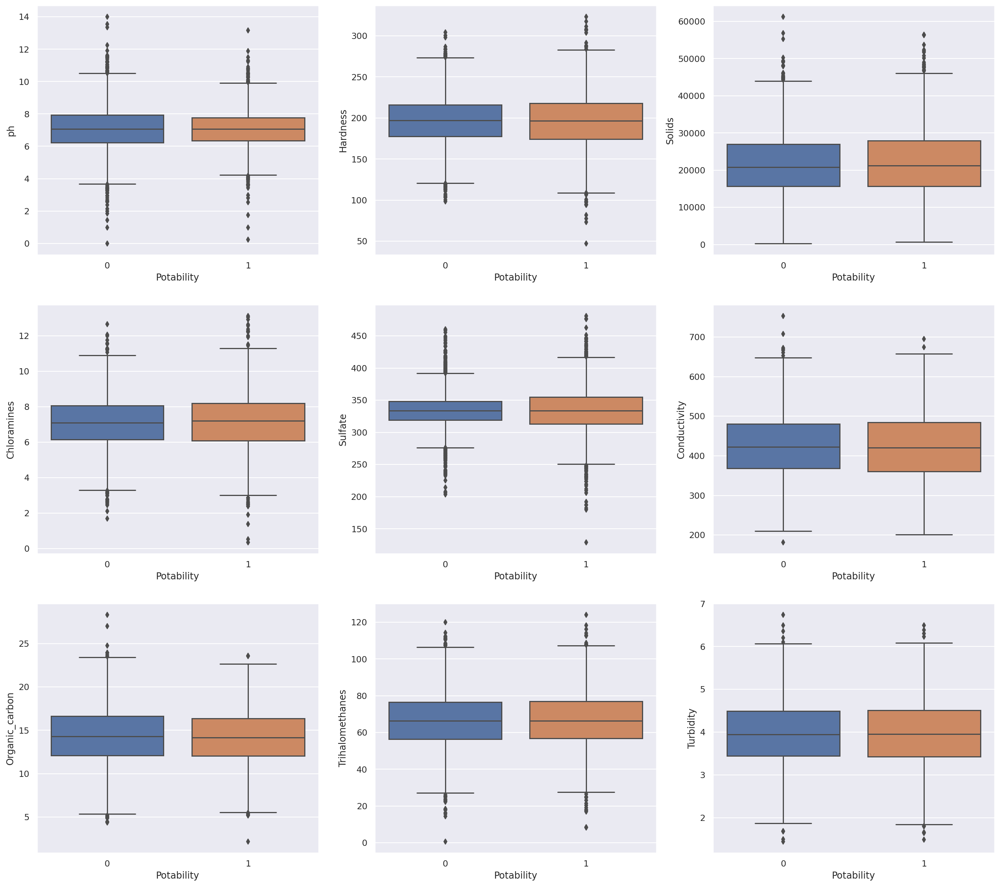

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(22,20))

sns.boxplot(ax=axes[0, 0], data=df, x='Potability', y='ph')
sns.boxplot(ax=axes[0, 1], data=df, x='Potability', y='Hardness')
sns.boxplot(ax=axes[0, 2], data=df, x='Potability', y='Solids')
sns.boxplot(ax=axes[1, 0], data=df, x='Potability', y='Chloramines')
sns.boxplot(ax=axes[1, 1], data=df, x='Potability', y='Sulfate')
sns.boxplot(ax=axes[1, 2], data=df, x='Potability', y='Conductivity')
sns.boxplot(ax=axes[2, 0], data=df, x='Potability', y='Organic_carbon')
sns.boxplot(ax=axes[2, 1], data=df, x='Potability', y='Trihalomethanes')
sns.boxplot(ax=axes[2, 2], data=df, x='Potability', y='Turbidity')


1. From The boxplot we can clearly see that there are outliers present in the set which we will remove later in the code

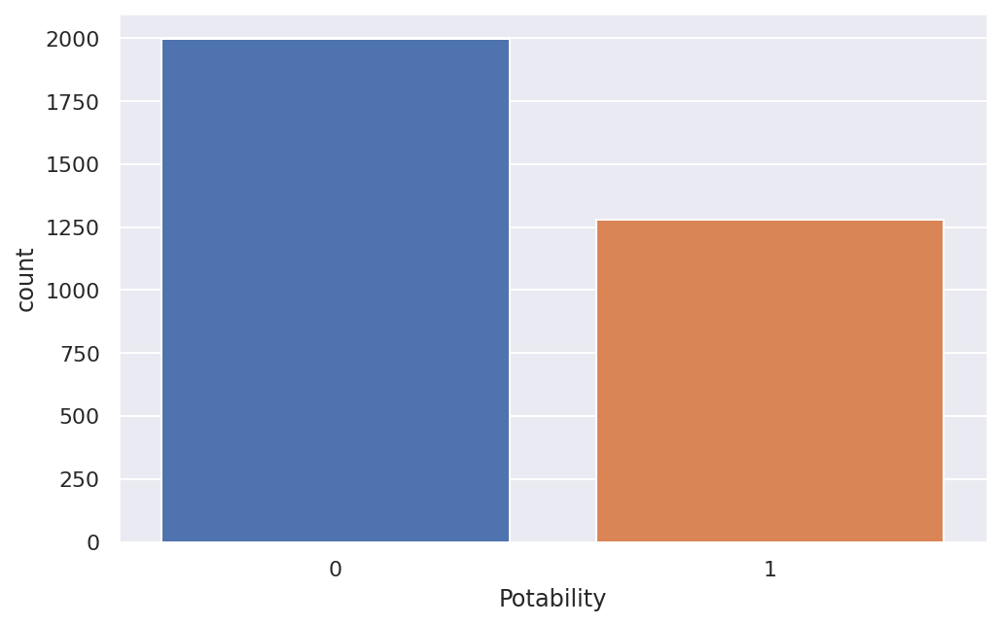

In [ ]:
plt.figure(figsize=(8,5))

sns.countplot(x='Potability',data=df,saturation=0.95)

In [ ]:
df['Potability'].value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

In [ ]:
print("Potable water %",(df['Potability'].value_counts()[1]/len(df)*100))
print("Non-Potable water %",(df['Potability'].value_counts()[0]/len(df)*100))

Potable water % 39.010989010989015
Non-Potable water % 60.98901098901099


In [ ]:
df.iloc[:,:-1].mean().to_frame().T

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.28497,66.396293,3.966786


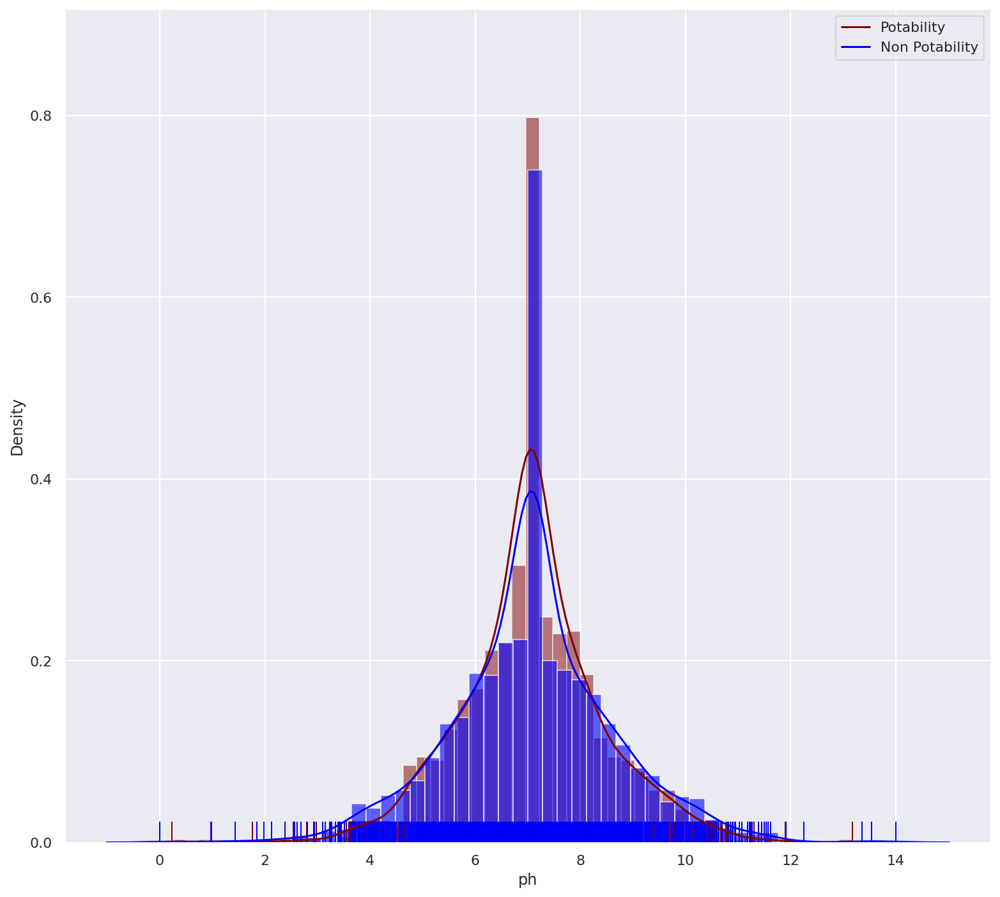

In [ ]:
plt.figure(figsize=(13,12))
sns.distplot(df['ph'][df.Potability==1],hist=True, rug=True,color='Maroon',hist_kws={'alpha':0.50})
sns.distplot(df['ph'][df.Potability==0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.60})
plt.legend(['Potability','Non Potability'])

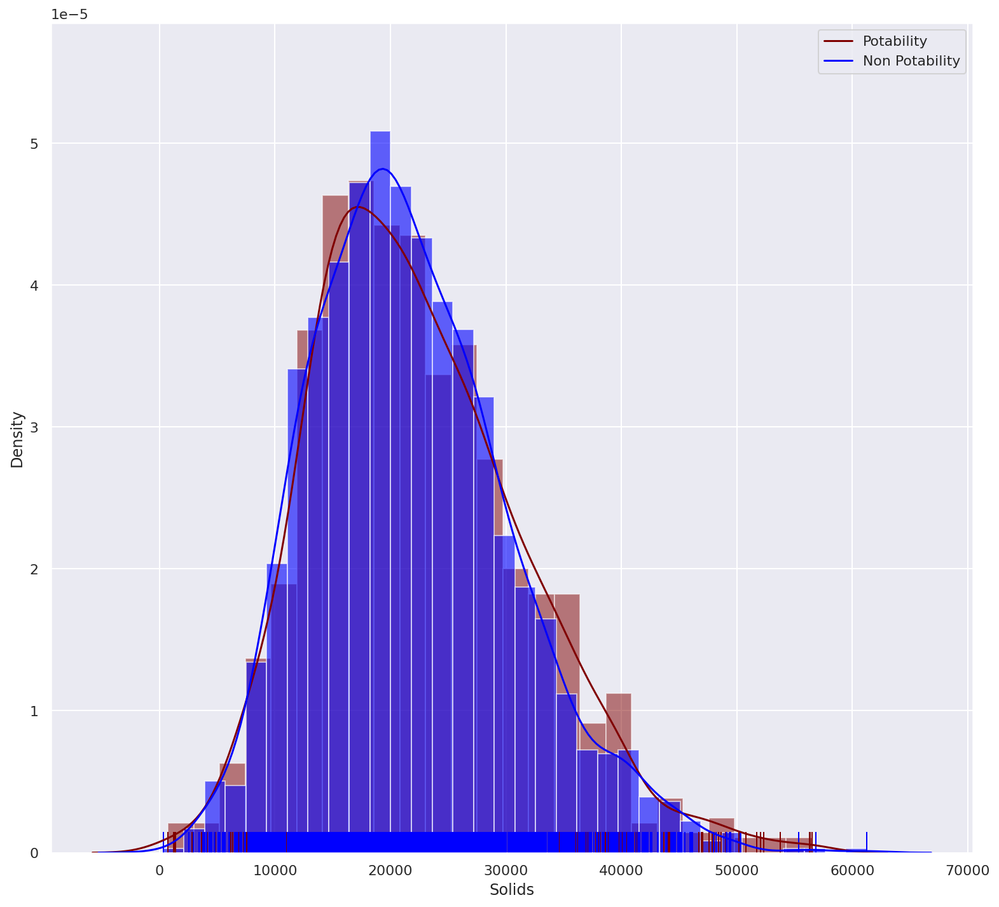

In [ ]:
plt.figure(figsize=(13,12))
sns.distplot(df['Solids'][df.Potability==1],hist=True, rug=True,color='Maroon',hist_kws={'alpha':0.50})
sns.distplot(df['Solids'][df.Potability==0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.60})
plt.legend(['Potability','Non Potability'])

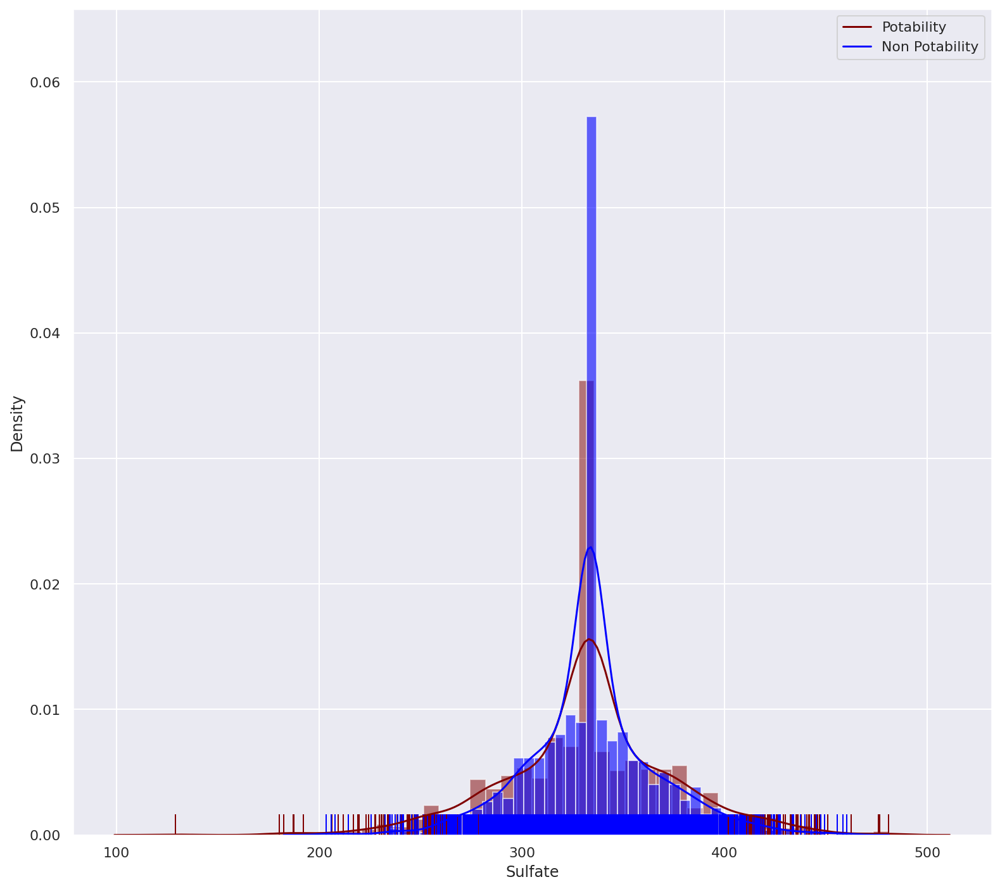

In [ ]:
plt.figure(figsize=(13,12))
sns.distplot(df['Sulfate'][df.Potability==1],hist=True, rug=True,color='Maroon',hist_kws={'alpha':0.50})
sns.distplot(df['Sulfate'][df.Potability==0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.60})
plt.legend(['Potability','Non Potability'])

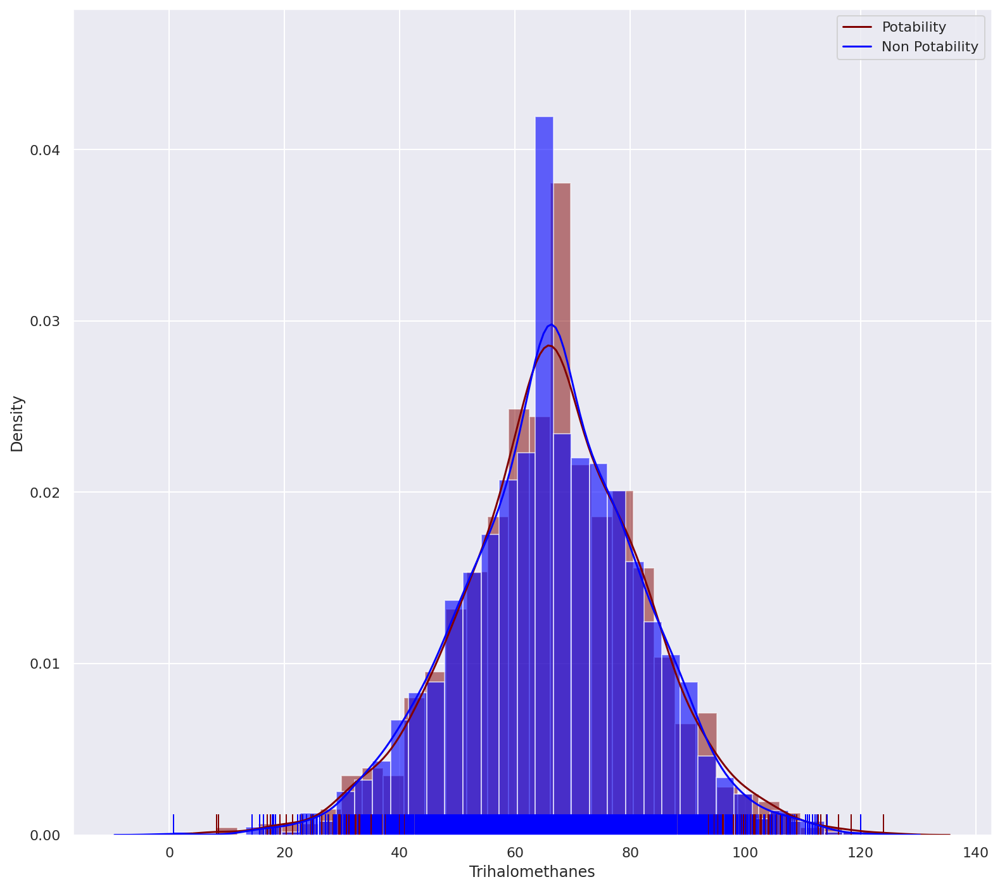

In [ ]:
plt.figure(figsize=(13,12))
sns.distplot(df['Trihalomethanes'][df.Potability==1],hist=True, rug=True,color='Maroon',hist_kws={'alpha':0.50})
sns.distplot(df['Trihalomethanes'][df.Potability==0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.60})
plt.legend(['Potability','Non Potability'])

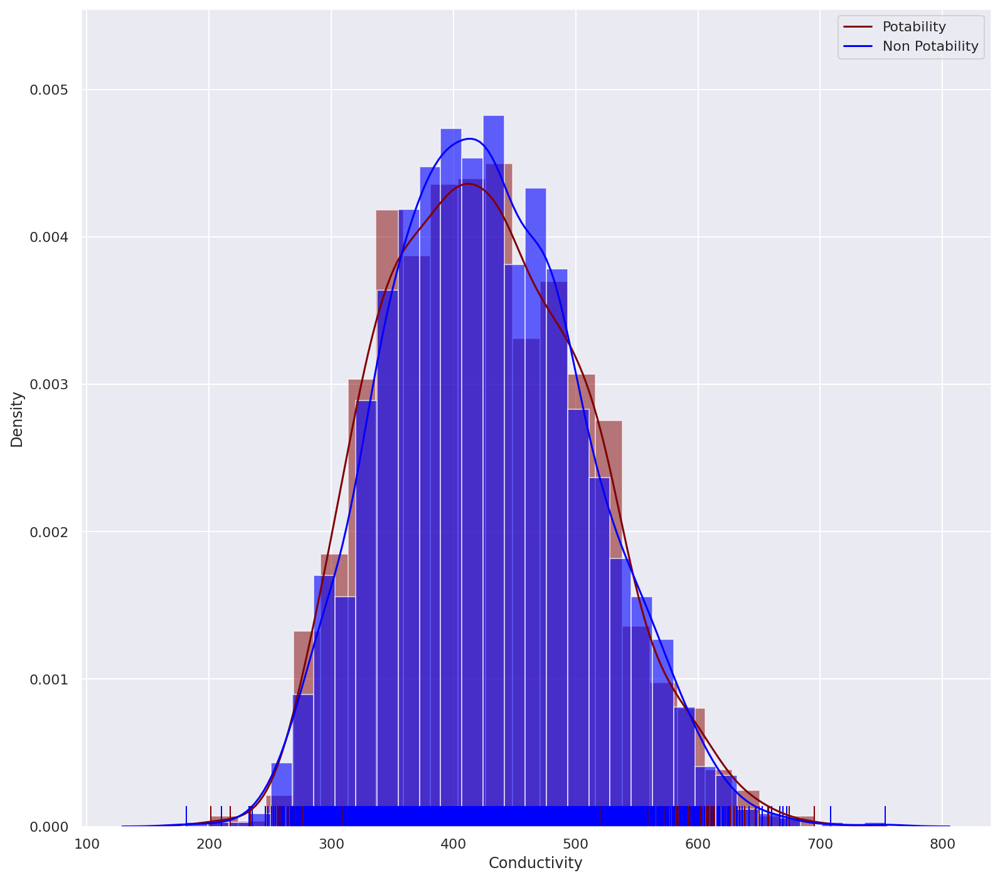

In [ ]:
plt.figure(figsize=(13,12))
sns.distplot(df['Conductivity'][df.Potability==1],hist=True, rug=True,color='Maroon',hist_kws={'alpha':0.50})
sns.distplot(df['Conductivity'][df.Potability==0],hist=True, rug=True,color='Blue',hist_kws={'alpha':0.60})
plt.legend(['Potability','Non Potability'])

1. Both the Potable and Non Potable Water is within the range of WHO standard i.e 6.5 and 8.5
2. Solids contained in both potable and non potable water is high but containment is less in Potable water.
3. Sulfate containment in Non Potable water is too high compare to Potable water but still both water is drinkable as sulfate containment is less than 1000mg/L
4. Trihalomethanes containment is high in non potable water but less than permissible limit but still this non potable water is not recommended to drink.
5. Conductivity of the non potable water is too high above permissible limit. This because of containments of solid,organic matter,etc. 
6. From The Mean table We can also see that most water is below ph 8.5 but conductivitiy is high that makes it unhealthy.
**As the conductivity, presence of high Trihalomethanes and other levels are quite high than Potable water, This makes it unhealty to drink.Therefore almost 60% of water is Non-Potable Water.**

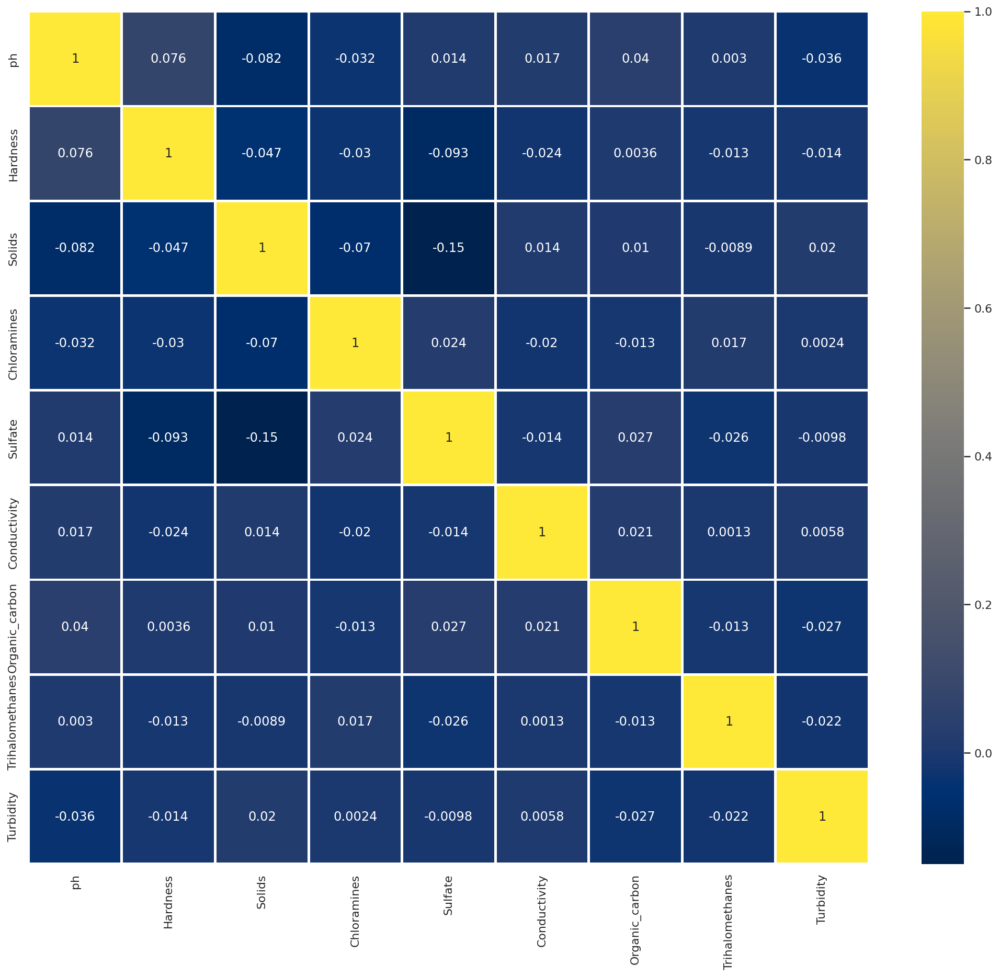

In [ ]:
plt.figure(figsize=(18,15))
corr=df.iloc[:,:-1].corr()
corr_feat = corr.index
sns.heatmap(df[corr_feat].corr(),cmap='cividis',annot=True,linewidths=2)

**From the Correlation Table we see that there no such independent variable that is highly correlated to another independent variable**

In [ ]:
bin=np.linspace(min(df['ph']),max(df['ph']),15)
groups=[1,2,3,4,5,6,7,8,9,10,11,12,13,14]
df['ph-binned']=pd.cut(df['ph'],bins=bin,labels=groups)

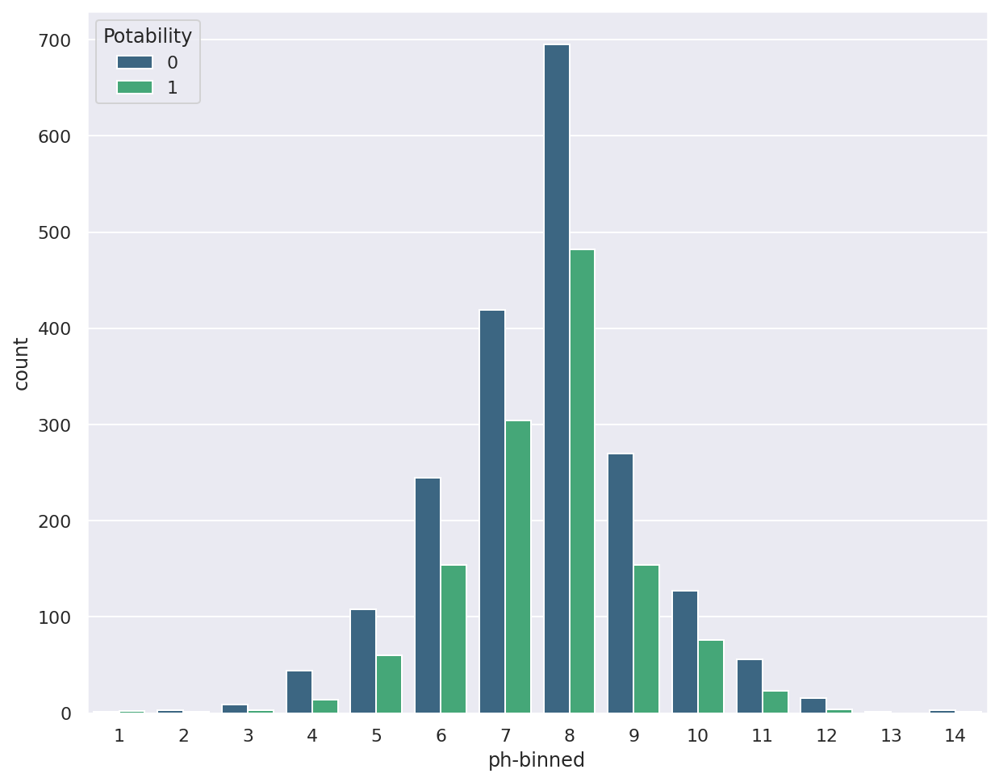

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(df['ph-binned'],hue=df['Potability'],palette='viridis')

In [ ]:
df.drop(columns='ph-binned',axis=1,inplace=True)

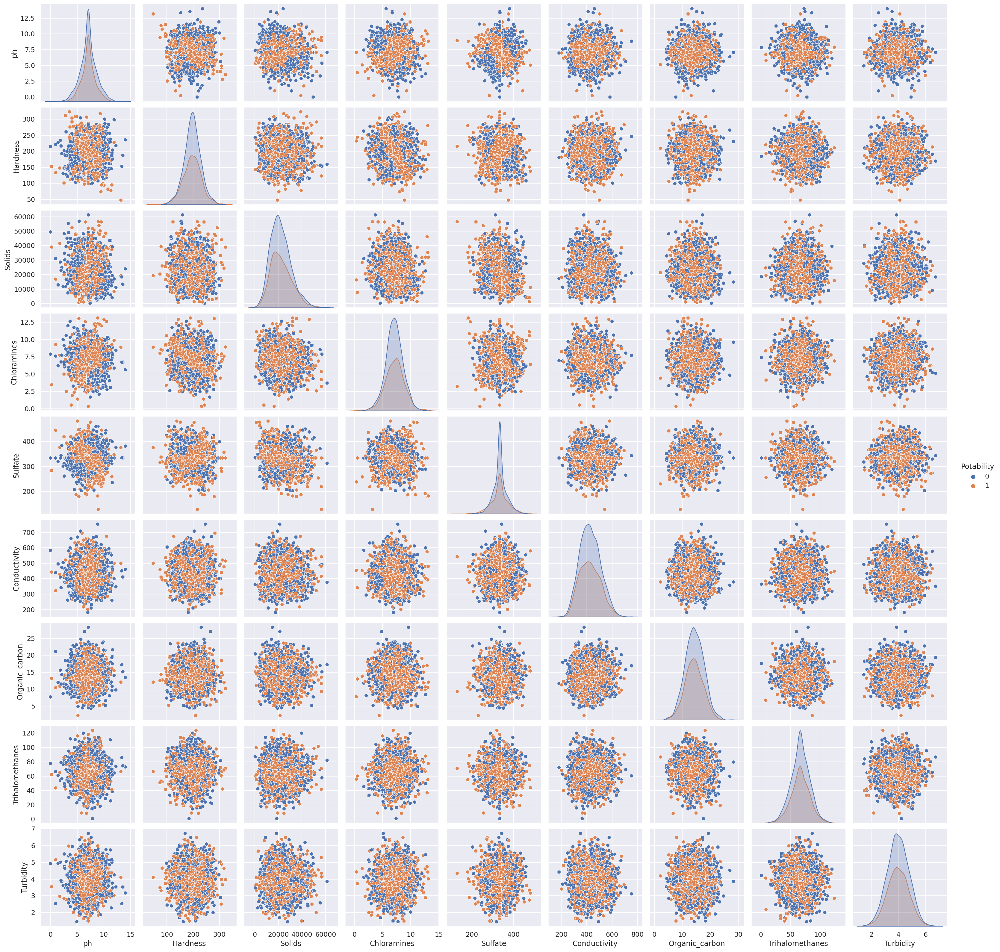

In [ ]:
sns.pairplot(df,hue='Potability')

**PREPARATION**

In [ ]:
#Old Skewness
df.skew()

ph                 0.027796
Hardness          -0.039342
Solids             0.621634
Chloramines       -0.012098
Sulfate           -0.041184
Conductivity       0.264490
Organic_carbon     0.025533
Trihalomethanes   -0.085161
Turbidity         -0.007817
Potability         0.450784
dtype: float64

In [ ]:
from scipy import stats
import pylab
def normality(data,feature):
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    sns.kdeplot(data[feature])
    plt.subplot(1,2,2)
    stats.probplot(data[feature],plot=pylab)
    plt.show()

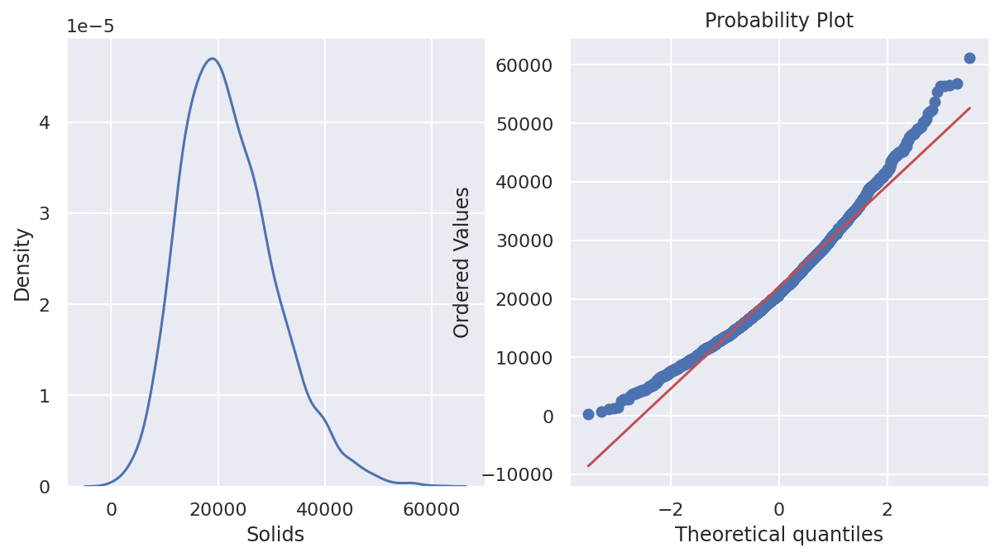

In [ ]:
normality(df,'Solids')

In [ ]:
df['Solids'],param=stats.boxcox(df['Solids'])

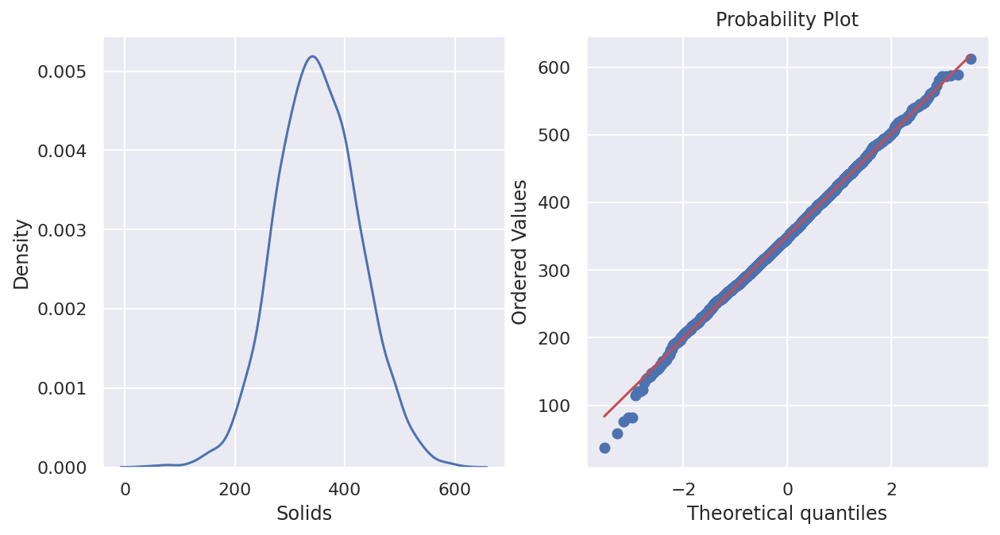

In [ ]:
normality(df,'Solids')

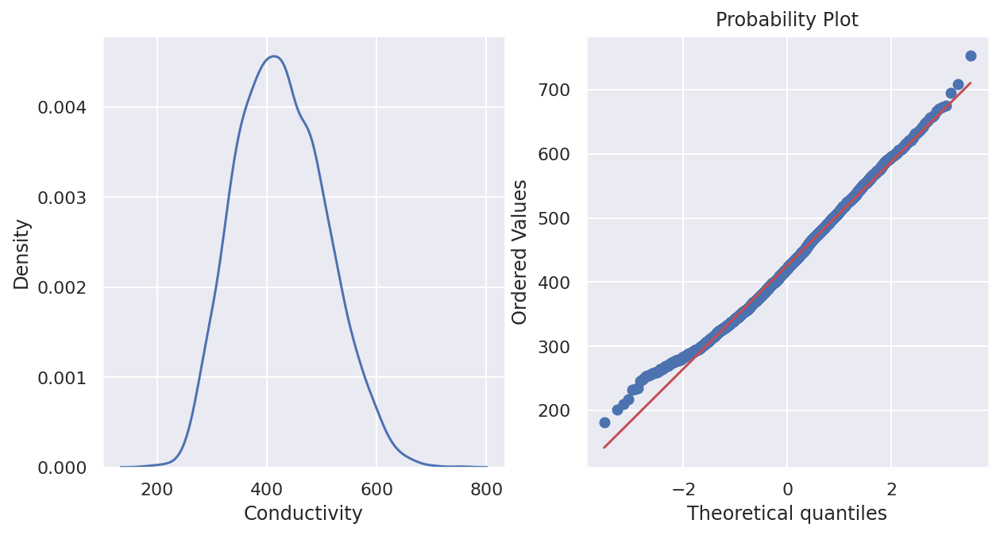

In [ ]:
normality(df,'Conductivity')

In [ ]:
df['Conductivity'],param=stats.boxcox(df['Conductivity'])

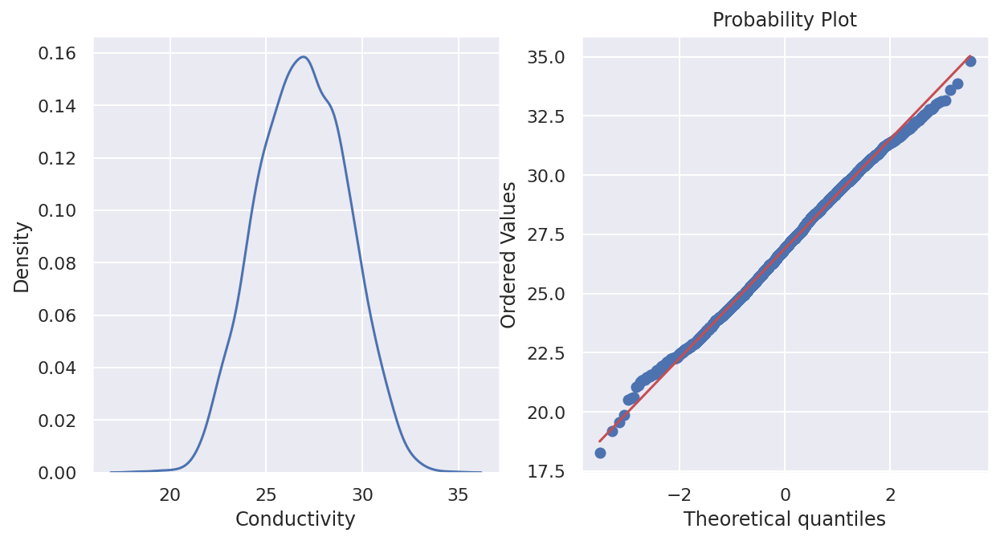

In [ ]:
normality(df,'Conductivity')

In [ ]:
df.skew()

ph                 0.027796
Hardness          -0.039342
Solids             0.019901
Chloramines       -0.012098
Sulfate           -0.041184
Conductivity      -0.009452
Organic_carbon     0.025533
Trihalomethanes   -0.085161
Turbidity         -0.007817
Potability         0.450784
dtype: float64

**We perform Gaussian Transform i.e Boxcox transformation method on Solids and Conductivity only as they were mostly skewed and others not as there skeweness was almost good i.e skew value close to 0 and we did'nt perform transformation on Target Data is its a discrete value.**

In [ ]:
X = df.loc[:,df.columns != "Potability"]
X.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,7.080795,204.890455,347.300514,7.300212,368.516441,30.634962,10.379783,86.990970,2.963135
1,3.716080,129.422921,327.784397,6.635246,333.775777,31.315285,15.180013,56.329076,4.500656
2,8.099124,224.236259,339.460582,9.275884,333.775777,26.804205,16.868637,66.420093,3.055934
3,8.316766,214.373394,357.951918,8.059332,356.886136,25.144242,18.436524,100.341674,4.628771
4,9.092223,181.101509,321.696327,6.546600,310.135738,26.214282,11.558279,31.997993,4.075075


In [ ]:
y = df['Potability']

In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_)


[0.12456396 0.12024332 0.11258006 0.11196935 0.1261673  0.10316277
 0.10056582 0.10092379 0.09982363]


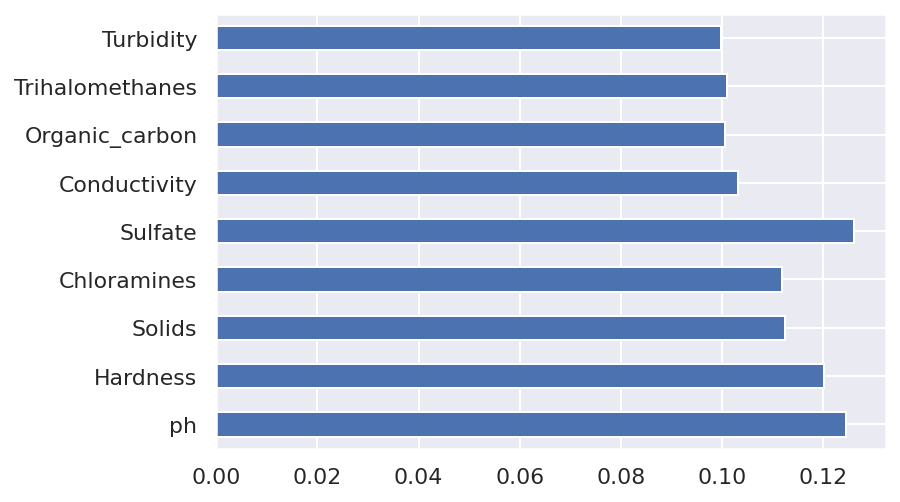

In [ ]:
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.plot(kind='barh')
plt.show()

**Model Training**

**LOGISTIC REGRESSION**

In [ ]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.10,stratify=y,random_state=42)

In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter

print('Balancing the data by SMOTE - Oversampling of Minority level\n')
smt = SMOTE()
counter = Counter(y_train)
print('Before SMOTE', counter)
x_train, y_train = smt.fit_resample(x_train, y_train)
counter = Counter(y_train)
print('\nAfter SMOTE', counter)


Balancing the data by SMOTE - Oversampling of Minority level

Before SMOTE Counter({0: 1798, 1: 1150})

After SMOTE Counter({1: 1798, 0: 1798})


In [ ]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
logireg = LogisticRegression()

In [ ]:
logireg.fit(x_train,y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
logireg.score(x_test,y_test)

0.6128048780487805

In [ ]:
y_pred_train = logireg.predict_proba(x_train)[:,1]>=0.495

In [ ]:
y_pred_test = logireg.predict_proba(x_test)[:,1]>=0.495

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train))
lg_acc=accuracy_score(y_test,y_pred_test)
print("Test accuracy: ",lg_acc)

Training accuracy:  0.6099050203527816
Test accuracy:  0.6128048780487805


Text(133.10000000000008, 0.5, 'Actual')

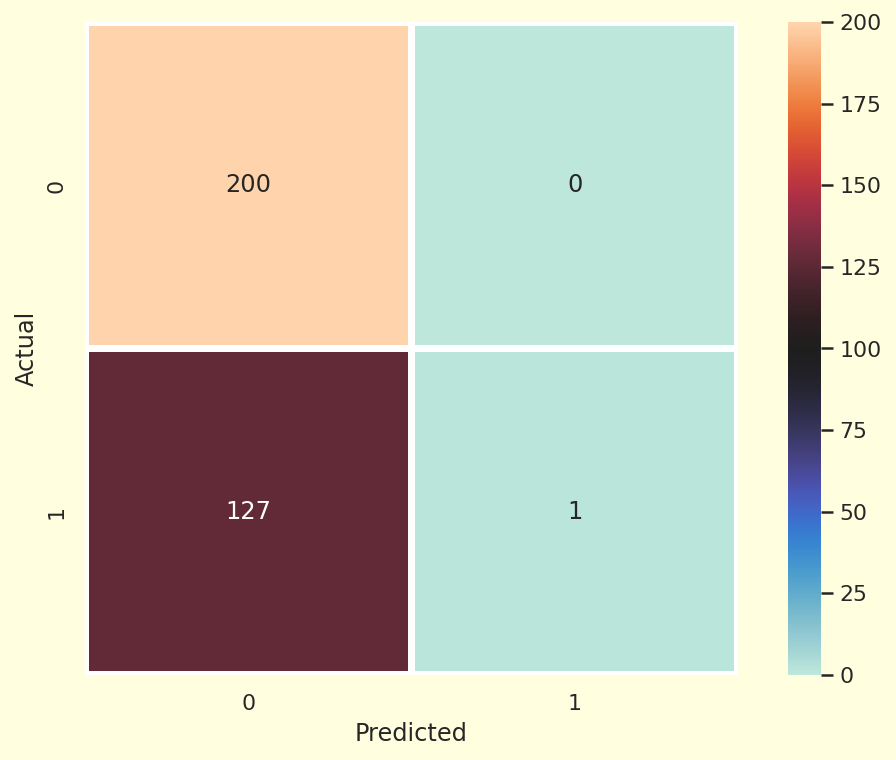

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test)

0.50390625

In [ ]:
print(classification_report(y_test,y_pred_test))

              precision    recall  f1-score   support

           0       0.61      1.00      0.76       200
           1       1.00      0.01      0.02       128

    accuracy                           0.61       328
   macro avg       0.81      0.50      0.39       328
weighted avg       0.76      0.61      0.47       328



In [ ]:
print((cross_val_score(logireg,x_train,y_train,cv=10,scoring='accuracy')).mean())
logi_cross= cross_val_score(logireg,x_train,y_train,cv=10,scoring='accuracy').mean()

0.6099043007033322


**NAIVE BAYES**

In [ ]:
gb = GaussianNB()
gb.fit(x_train,y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [ ]:
gb.score(x_test,y_test)

0.6402439024390244

In [ ]:
y_pred_test_gb = gb.predict_proba(x_test)[:,1]>=0.475

In [ ]:
y_pred_train_gb = gb.predict_proba(x_train)[:,1]>=0.475

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_gb))
gb_acc=accuracy_score(y_test,y_pred_test_gb)
print("Test accuracy: ",gb_acc)

Training accuracy:  0.6255088195386703
Test accuracy:  0.6402439024390244


Text(133.10000000000008, 0.5, 'Actual')

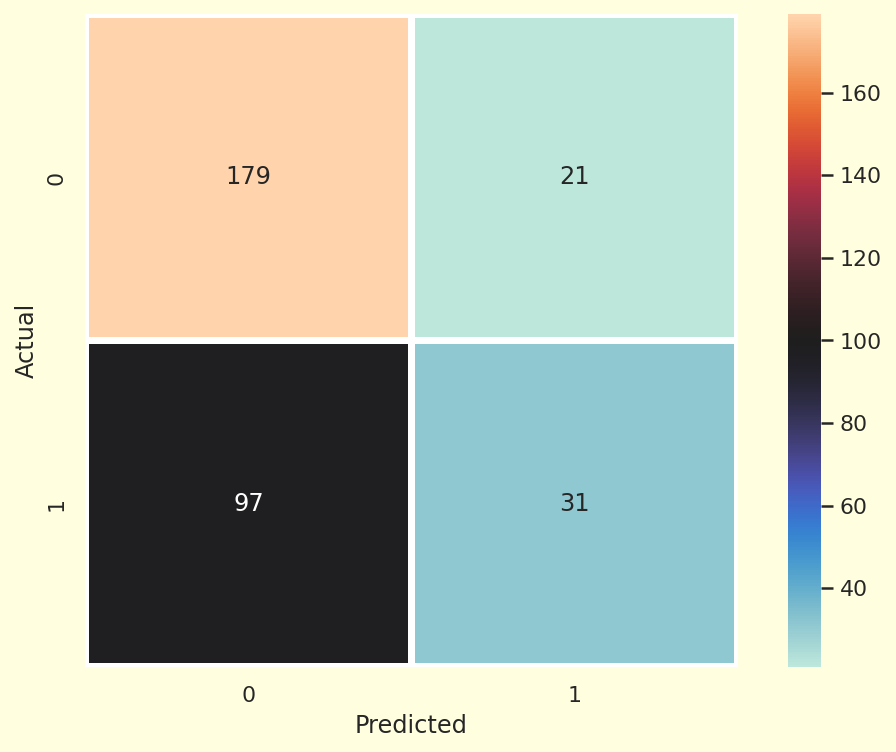

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_gb),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_gb)

0.56859375

In [ ]:
print((cross_val_score(gb, x_train,y_train,cv=10,scoring='accuracy')).mean())
gauss_cross=cross_val_score(gb,x_train,y_train,cv=10,scoring='accuracy').mean()

0.6231338637149776


In [ ]:
print(classification_report(y_test,y_pred_test_gb))

              precision    recall  f1-score   support

           0       0.65      0.90      0.75       200
           1       0.60      0.24      0.34       128

    accuracy                           0.64       328
   macro avg       0.62      0.57      0.55       328
weighted avg       0.63      0.64      0.59       328



**KNN Classifier**

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7)

In [ ]:
knn.fit(x_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=2,
                     weights='uniform')

In [ ]:
knn.score(x_train,y_train)

0.7388059701492538

In [ ]:
y_pred_test_knn = knn.predict(x_test)

In [ ]:
y_pred_train_knn = knn.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_knn))
knn_acc=accuracy_score(y_test,y_pred_test_knn)
print("Test accuracy: ",knn_acc)

Training accuracy:  0.7388059701492538
Test accuracy:  0.6341463414634146


In [ ]:
roc_auc_score(y_test,y_pred_test_knn)

0.57765625

Text(133.10000000000008, 0.5, 'Actual')

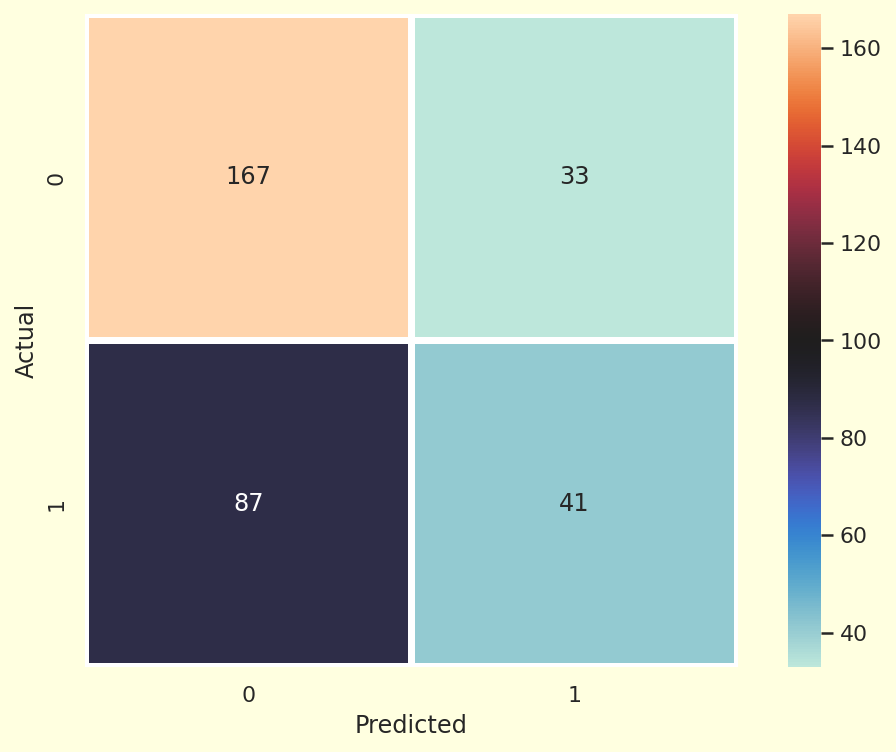

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_knn),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
print(classification_report(y_test,y_pred_test_knn))

              precision    recall  f1-score   support

           0       0.66      0.83      0.74       200
           1       0.55      0.32      0.41       128

    accuracy                           0.63       328
   macro avg       0.61      0.58      0.57       328
weighted avg       0.62      0.63      0.61       328



In [ ]:
print((cross_val_score(knn,x_train,y_train,cv=10,scoring='accuracy')).mean())
knn_cross=cross_val_score(knn,x_train,y_train,cv=10,scoring='accuracy').mean()

0.6458722472039662


**DECISION TREE**

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy',min_samples_leaf=2,min_samples_split=2,max_depth=8)

In [ ]:
dt.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=8, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
dt.score(x_test,y_test)

0.6737804878048781

In [ ]:
y_pred_test_dt = dt.predict(x_test)


In [ ]:
y_pred_train_dt = dt.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_dt))
dt_acc=accuracy_score(y_test,y_pred_test_dt)
print("Test accuracy: ",dt_acc)

Training accuracy:  0.7204884667571235
Test accuracy:  0.6737804878048781


In [ ]:
roc_auc_score(y_test,y_pred_test_dt)

0.6059375

Text(133.10000000000008, 0.5, 'Actual')

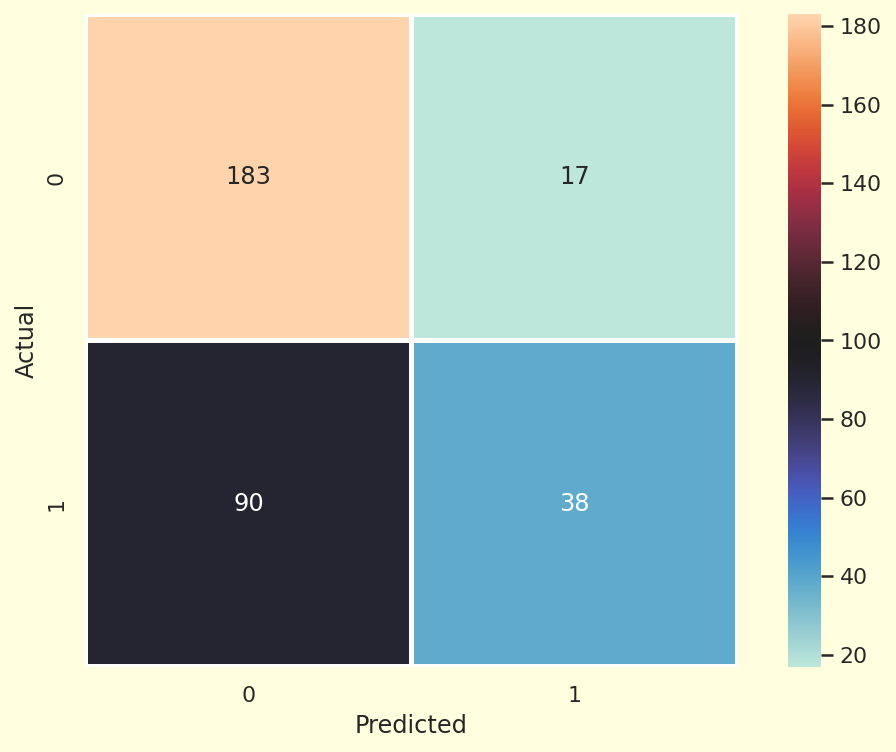

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_dt),annot=True,linewidths=2,cmap='icefire',fmt='.3g',linecolor='WHITE',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
print(classification_report(y_test,y_pred_test_dt))

              precision    recall  f1-score   support

           0       0.67      0.92      0.77       200
           1       0.69      0.30      0.42       128

    accuracy                           0.67       328
   macro avg       0.68      0.61      0.59       328
weighted avg       0.68      0.67      0.63       328



In [ ]:
print((cross_val_score(dt, x_train,y_train, cv=10,scoring='accuracy')).mean())
dt_cross = cross_val_score(dt, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6340055344171567


**ADABOOST with Decision Tree**

In [ ]:
ada_dt = AdaBoostClassifier(dt,n_estimators=70,learning_rate=0.1)

In [ ]:
ada_dt.fit(x_train,y_train)

AdaBoostClassifier(algorithm='SAMME.R',
                   base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                         class_weight=None,
                                                         criterion='entropy',
                                                         max_depth=8,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=2,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         presort='deprecated',
                       

In [ ]:
ada_dt.score(x_train,y_train)

1.0

In [ ]:
y_pred_test_adadt = ada_dt.predict(x_test)

In [ ]:
y_pred_train_adadt= ada_dt.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_adadt))
adadt_acc=accuracy_score(y_test,y_pred_test_adadt)
print("Test accuracy: ",adadt_acc)

Training accuracy:  1.0
Test accuracy:  0.6097560975609756


Text(133.10000000000008, 0.5, 'Actual')

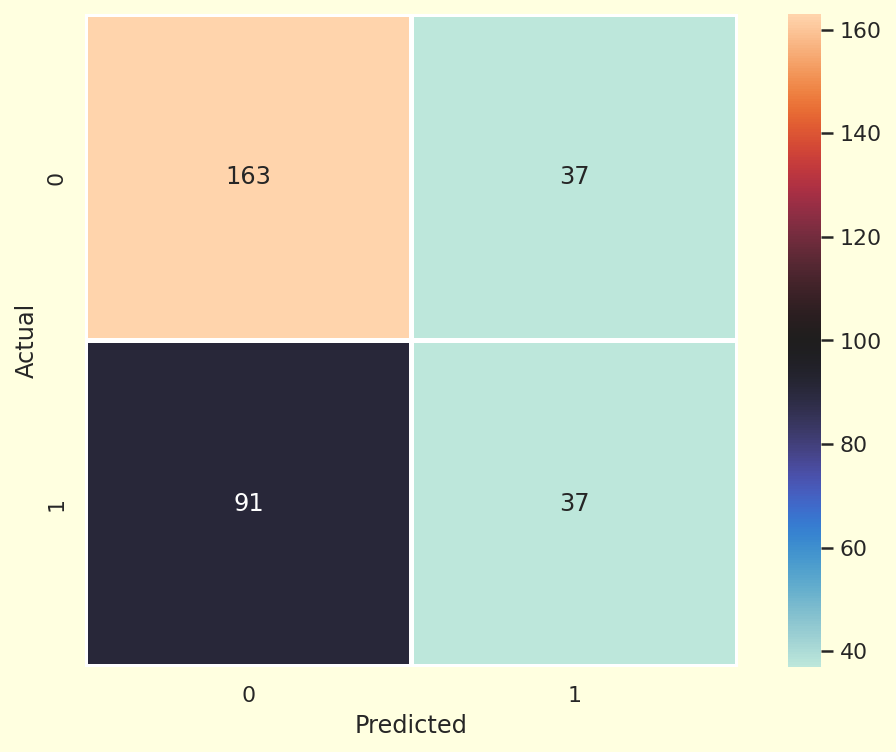

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_adadt),annot=True,linewidths=2,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_adadt)

0.55203125

In [ ]:
print(classification_report(y_test,y_pred_test_adadt))

              precision    recall  f1-score   support

           0       0.64      0.81      0.72       200
           1       0.50      0.29      0.37       128

    accuracy                           0.61       328
   macro avg       0.57      0.55      0.54       328
weighted avg       0.59      0.61      0.58       328



In [ ]:
print((cross_val_score(ada_dt, x_train,y_train,cv=10,scoring='accuracy')).mean())
ada_cross=cross_val_score(ada_dt, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6397555632422461


**XGBOOST**

In [ ]:
xgb = XGBClassifier(learning_rate=0.02)

In [ ]:
xgb.fit(x_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.02, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
xgb.score(x_test,y_test)

0.6615853658536586

In [ ]:
y_pred_test_xgb= xgb.predict(x_test)


In [ ]:
y_pred_train_xgb = xgb.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_xgb))
xgb_acc=accuracy_score(y_test,y_pred_test_xgb)
print("Test accuracy: ",xgb_acc)

Training accuracy:  0.673337856173677
Test accuracy:  0.6615853658536586


Text(133.10000000000008, 0.5, 'Actual')

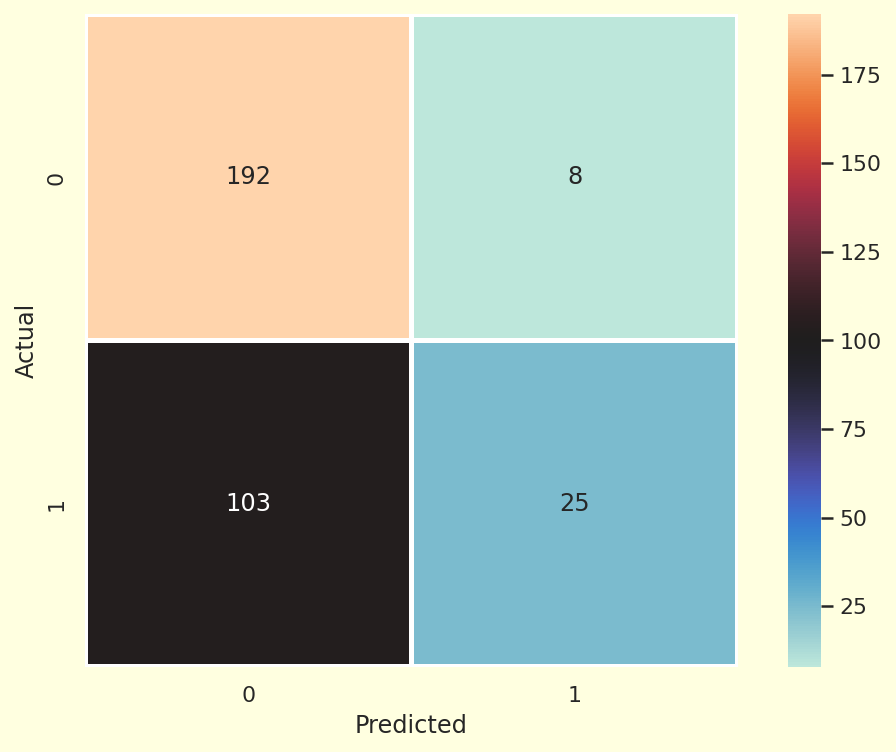

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_xgb),annot=True,linewidths=2,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_xgb)

0.57765625

In [ ]:
print(classification_report(y_test,y_pred_test_xgb))

              precision    recall  f1-score   support

           0       0.65      0.96      0.78       200
           1       0.76      0.20      0.31       128

    accuracy                           0.66       328
   macro avg       0.70      0.58      0.54       328
weighted avg       0.69      0.66      0.59       328



In [ ]:
print((cross_val_score(xgb, x_train,y_train,cv=10,scoring='accuracy')).mean())
xgb_cross=cross_val_score(xgb, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6417963795687768


**MLP**


In [ ]:
mlp = MLPClassifier(max_iter=685,random_state=42)

In [ ]:
mlp.fit(x_train,y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(100,), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=685,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=42, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

In [ ]:
mlp.score(x_test,y_test)

0.6280487804878049

In [ ]:
y_pred_test_mlp= mlp.predict(x_test)

In [ ]:
y_pred_train_mlp= mlp.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_mlp))
mlp_acc=accuracy_score(y_test,y_pred_test_mlp)
print("Test accuracy: ",mlp_acc)

Training accuracy:  0.832089552238806
Test accuracy:  0.6280487804878049


Text(133.10000000000008, 0.5, 'Actual')

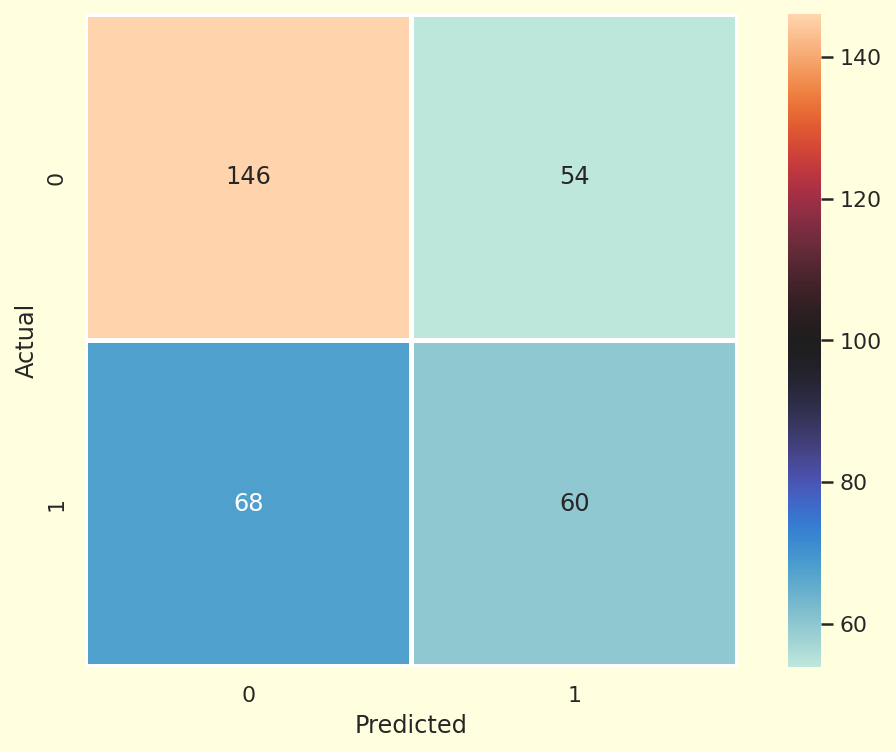

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_mlp),annot=True,linewidths=2,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_mlp)

0.599375

In [ ]:
print(classification_report(y_test,y_pred_test_mlp))

              precision    recall  f1-score   support

           0       0.68      0.73      0.71       200
           1       0.53      0.47      0.50       128

    accuracy                           0.63       328
   macro avg       0.60      0.60      0.60       328
weighted avg       0.62      0.63      0.62       328



In [ ]:
print((cross_val_score(mlp, x_train,y_train,cv=10,scoring='accuracy')).mean())
mlp_cross=cross_val_score(mlp, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6641830969676006


**Random Forest**

In [ ]:
rfc = RandomForestClassifier(n_estimators=1500,criterion='entropy',random_state=42)

In [ ]:
rfc.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1500,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [ ]:
rfc.score(x_test,y_test)

0.6920731707317073

In [ ]:
y_pred_test_rfc= rfc.predict_proba(x_test)[:,1]>=0.37

In [ ]:
y_pred_train_rfc= rfc.predict_proba(x_train)[:,1]>=0.37

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_rfc))
rfc_acc=accuracy_score(y_test,y_pred_test_rfc)
print("Test accuracy: ",rfc_acc)

Training accuracy:  1.0
Test accuracy:  0.6371951219512195


Text(133.10000000000008, 0.5, 'Actual')

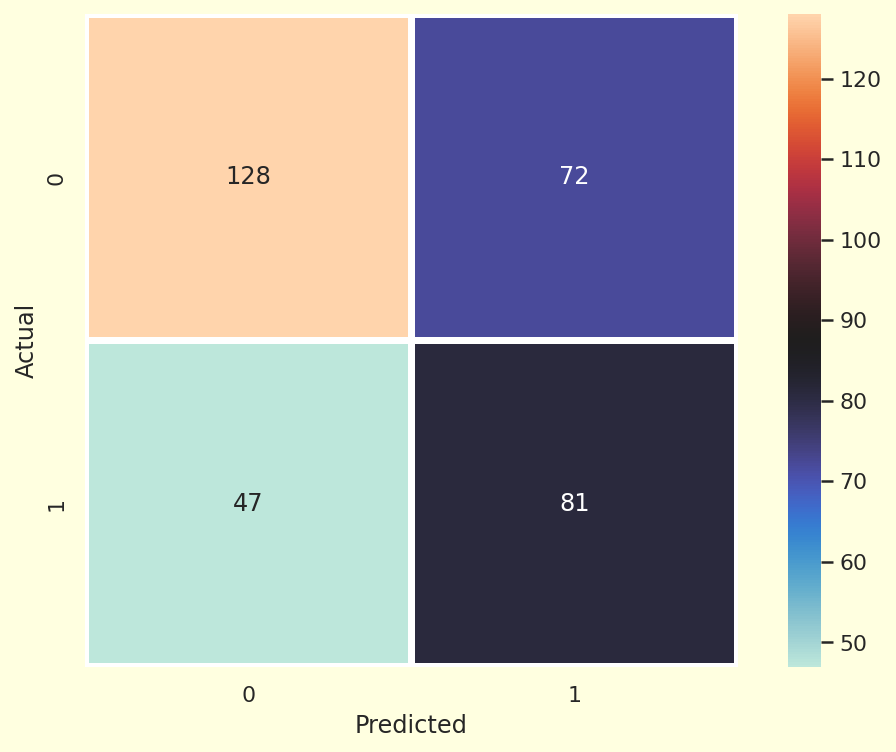

In [ ]:

plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_rfc),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:

roc_auc_score(y_test,y_pred_test_rfc)

0.63640625

In [ ]:
print(classification_report(y_test,y_pred_test_rfc))

              precision    recall  f1-score   support

           0       0.73      0.64      0.68       200
           1       0.53      0.63      0.58       128

    accuracy                           0.64       328
   macro avg       0.63      0.64      0.63       328
weighted avg       0.65      0.64      0.64       328



In [ ]:
rfc_cross=cross_val_score(rfc, x_train,y_train,cv=10,scoring='accuracy').mean()

In [ ]:
#import pickle
#pickle_out = open("mlp.pkl","wb")
#pickle.dump(mlp, pickle_out)
#pickle_out.close()

**Support Vector Classifier**

In [ ]:
svc=SVC(C=0.8,gamma='auto',kernel='rbf',random_state=42,probability=True)

In [ ]:
svc.fit(x_train,y_train)

SVC(C=0.8, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=True, random_state=42, shrinking=True, tol=0.001,
    verbose=False)

In [ ]:
svc.score(x_test,y_test)

0.6676829268292683

In [ ]:
y_pred_test_svc= svc.predict(x_test)


In [ ]:
y_pred_train_svc= svc.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_svc))
svc_acc=accuracy_score(y_test,y_pred_test_svc)
print("Test accuracy: ",accuracy_score(y_test,y_pred_test_svc))

Training accuracy:  0.7187924016282226
Test accuracy:  0.6676829268292683


Text(133.10000000000008, 0.5, 'Actual')

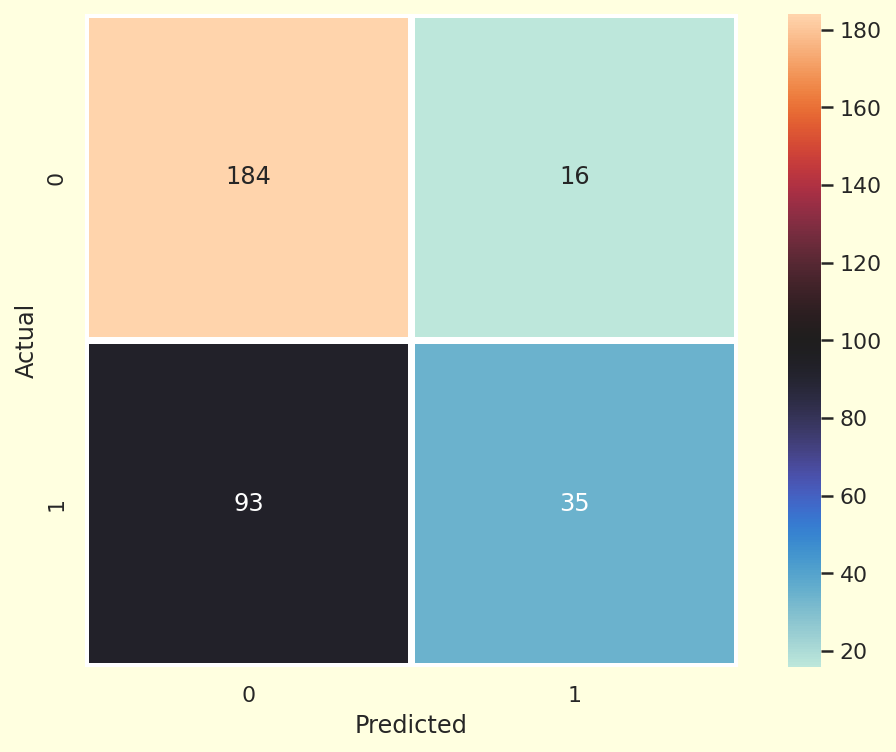

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_svc),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_svc)

0.5967187500000001

In [ ]:
print(classification_report(y_test,y_pred_test_svc))

              precision    recall  f1-score   support

           0       0.66      0.92      0.77       200
           1       0.69      0.27      0.39       128

    accuracy                           0.67       328
   macro avg       0.68      0.60      0.58       328
weighted avg       0.67      0.67      0.62       328



In [ ]:
print((cross_val_score(svc, x_train,y_train,cv=10,scoring='accuracy')).mean())
svc_cross=cross_val_score(svc, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6702847918828547


**Models Overview**

In [ ]:
model_df = pd.DataFrame({
    'Models' : ['Logistic Regression', 'GaussianNB', 'KNN', 'Decision Tree',  'AdaBoost with Decision Tree', 'XGBoost','MLP',
             'Random Forest', 'SVC',],
    'Accuracy Score' : [lg_acc,gb_acc,knn_acc,dt_acc,adadt_acc,xgb_acc,mlp_acc,rfc_acc,svc_acc],
    'Cross Val Score' :[logi_cross,gauss_cross,knn_cross,dt_cross,ada_cross,xgb_cross,mlp_cross,rfc_cross,svc_cross]
})

In [ ]:
model_df.sort_values(by = 'Accuracy Score').T

,4,0,6,2,1,5,8,3,7
Models,AdaBoost with Decision Tree,Logistic Regression,MLP,KNN,GaussianNB,XGBoost,SVC,Decision Tree,Random Forest
Accuracy Score,0.609756,0.612805,0.628049,0.634146,0.640244,0.661585,0.667683,0.67378,0.698171
Cross Val Score,0.623803,0.609904,0.664183,0.645872,0.623134,0.641796,0.670285,0.635361,0.671642


In [ ]:
plt.figure(figsize = (25,10))
sns.set_theme(style="whitegrid")
sns.barplot(x = 'Models', y = 'Accuracy Score', data = model_df)
plt.ylim(0.15,0.72)
plt.show()


In [ ]:
plt.figure(figsize = (25,10))
sns.set_theme(style="whitegrid")
sns.barplot(x = 'Models', y = 'Cross Val Score', data = model_df)
plt.ylim(0.15,0.75)
plt.show()


In [ ]:
#pip install catboost

     |████████████████████████████████| 69.2 MB 5.5 kB/s 


In [ ]:
from catboost import CatBoostClassifier

In [ ]:
cat = CatBoostClassifier(iterations=10,verbose=False)

In [ ]:
cat.fit(x_train,y_train)

In [ ]:
cat.score(x_test,y_test)

0.6219512195121951

In [ ]:
y_pred_test_cat= cat.predict(x_test)
y_pred_train_cat= cat.predict(x_train)

In [ ]:
print("Training accuracy: ",accuracy_score(y_train,y_pred_train_cat))
cat_acc=accuracy_score(y_test,y_pred_test_cat)
print("Test accuracy: ",accuracy_score(y_test,y_pred_test_cat))

Training accuracy:  0.7063403781979978
Test accuracy:  0.6219512195121951


Text(133.10000000000008, 0.5, 'Actual')

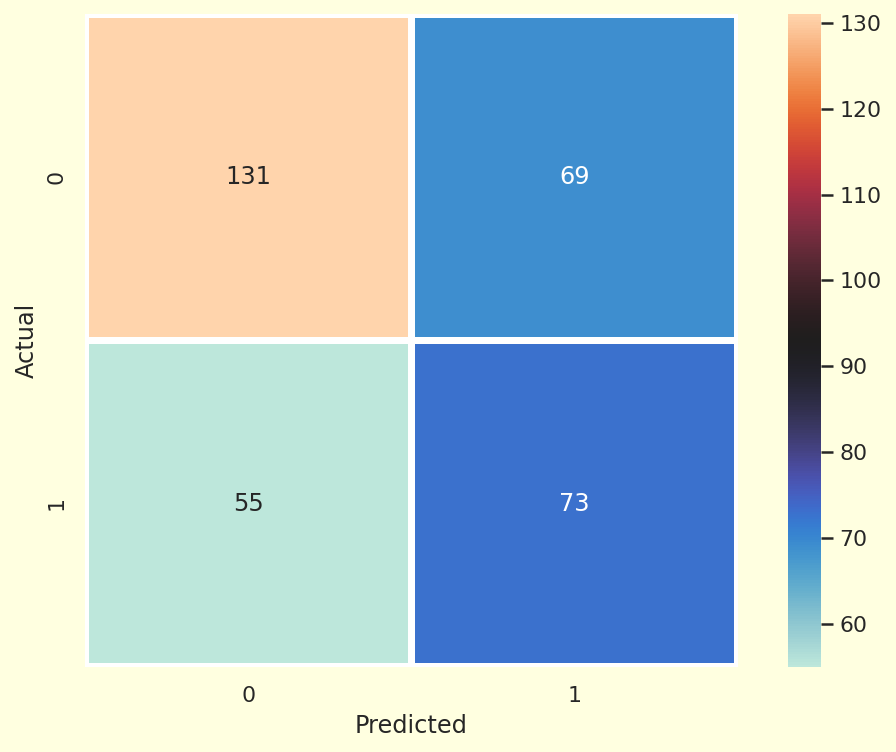

In [ ]:
plt.figure(figsize=(9,6),facecolor='lightyellow')
sns.heatmap(confusion_matrix(y_test,y_pred_test_cat),annot=True,linewidths=3,cmap='icefire',fmt='.3g',linecolor='white',square=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')

In [ ]:
roc_auc_score(y_test,y_pred_test_cat)

0.61265625

In [ ]:
print(classification_report(y_test,y_pred_test_cat))

              precision    recall  f1-score   support

           0       0.70      0.66      0.68       200
           1       0.51      0.57      0.54       128

    accuracy                           0.62       328
   macro avg       0.61      0.61      0.61       328
weighted avg       0.63      0.62      0.62       328



In [ ]:
print((cross_val_score(cat, x_train,y_train,cv=10,scoring='accuracy')).mean())
cat_cross=cross_val_score(cat, x_train,y_train,cv=10,scoring='accuracy').mean()

0.6390707211389662


In [ ]:
df.sample(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
2767,7.635265,205.067631,319.969984,7.156738,306.800286,25.371182,17.486815,32.920720,3.948304,1
1415,7.388519,201.057714,281.105940,7.766495,333.775777,30.549436,14.467095,74.374018,4.409054,0
1934,6.908853,184.944232,312.004693,6.404354,351.345326,27.252592,11.812942,77.371361,4.693949,1
2772,8.014183,244.120098,425.436529,7.714447,307.987458,23.396959,22.641598,61.578461,3.417076,1
122,7.080795,230.809482,401.780774,7.136498,369.310008,22.142131,9.578585,72.376909,4.197595,0
695,5.085429,173.565971,446.140396,6.033247,351.271267,29.219116,17.795957,62.466135,3.961731,1
1129,4.872561,224.705105,311.957384,7.078015,323.036852,24.864461,15.692176,79.962803,3.918006,1
1042,5.499489,230.308775,280.912254,9.619575,352.084333,27.471667,14.740787,66.396293,5.846827,0
2296,6.369974,128.616868,278.629595,9.066830,333.775777,23.732400,8.001415,36.007524,3.427066,0
636,6.098012,211.454010,485.923393,6.212191,333.775777,28.716297,11.791840,46.928041,4.590617,0


In [ ]:
rfc.predict([[	4.872561,	224.705105,	311.957384,	7.078015	,323.036852,24.864461,	15.692176,	79.962803,	3.918006]])

array([0])

In [ ]:
import pickle
pickle_out = open("rfc.pkl","wb")
pickle.dump(knn, pickle_out)
pickle_out.close()

In [ ]:
# [385]	 5.541979	185.671874	341.552676	10.236176	209.471058	29.486440	18.464015	49.371319	3.672976	1
# [2679] 7.103348	249.589359	153.339207	8.211762	293.078666	21.911188	18.422985	68.474194	4.417194	0